# Project : " Rice Leaf Disease Detection using Data Augmentation Technique in CNN "

# Team ID : PTID-CDS-JUL-23-1658

## Domain analysis
Leaf is important part of any plant. Leaves are the major eco-physiological parts of a plant. Leaves direct interact with the atmosphere and do many things including
* Absorbing carbon dioxide.
* Growth of plant and seeds depends on leaves photosynthesis process.
* Releasing the oxygen formed as a byproduct of photosynthesis.
so leaves are generate very crucial roll. leaves disease to impact on growth of plant and seeds. Here we have data of rice leaf disease like ● Leaf smut ● Brown spot  ● Bacterial leaf blight. 
* Controlling rice plant disease used convolution neural network (CNN) module to processing image of leaf and trained our model this highly morden techniques help to find out leaf disease quick solution without consuming more time. This techniques helpful to Unskilled farmer. 

### About Bacterial leaf disease:-
* Bacterial leaf blight is often first noticed in fields as brown areas about 3 to 4 feet in diameter. Leaf symptoms appear as irregular brown spots, often beginning on the leaf margins. Lesions initially have an irregular yellow halo and may appear watersoaked. Spots coalesce and cause a leaf blight and dark brown streaks develop on leaf petioles. Floral parts may also be blighted. A sticky amber-colored bacterial exudate, which is a diagnostic sign of the disease, may be present on leaves or observed flowing downward on petioles and flower stalks.

In [39]:
Bacterial=load_img(r"C:\Users\Admin\Downloads\Data\Train\Bacterial leaf blight\DSC_0374.JPG")


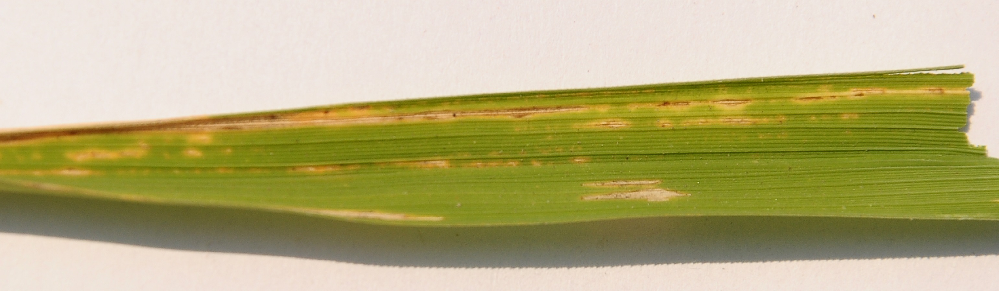

In [40]:
Bacterial

### About Smut disease:-
* Leaf smut,caused by the fungus Entyloma oryzae,is a widely distributed,but somewhat minor,disease of rice.The fungus produces slightly raised,angular,black spots (sori) on both sides of the leaves.Although rare,it also can produce spots on leaf sheaths.The black spots are about 0.5 to 5.0 millimeters long and 0.5 to 1.5 millimeters wide. 
* The fungus is spread by airborne spores and overwinters on diseased leaf debris in soil. Leaf smut occurs late in the growing season and causes little loss. The disease is favored by high nitrogen rates. Control measures are not recommended.

In [37]:
smut=load_img(r"C:\Users\Admin\Downloads\Data\Train\Leaf smut\DSC_0507.JPG")


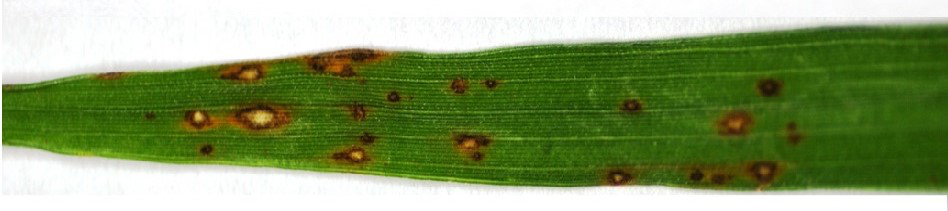

In [38]:
smut

### About brown spot disease
* Brown spot is a fungal disease that infects the coleoptile, leaves, leaf sheath, panicle branches, glumes, and spikelets. 
Its most observable damage is the numerous big spots on the leaves which can kill the whole leaf. When infection occurs in the seed, unfilled grains or spotted or discolored seeds are formed.
* The disease can develop in areas with high relative humidity (86−100%) and temperature between 16 and 36°C. It is common in unflooded and nutrient-deficient soil, or in soils that accumulate toxic substances.

In [34]:
Brown_spot=load_img(r"C:\Users\Admin\Downloads\Data\Train\Brown spot\DSC_0113.JPG")


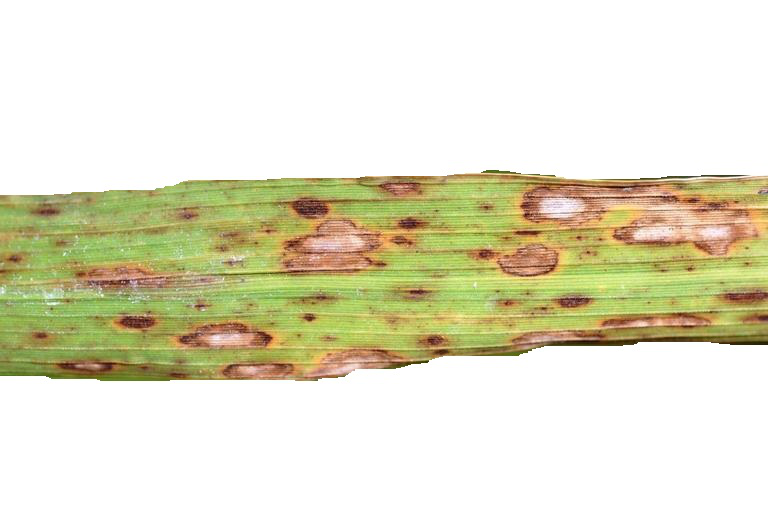

In [35]:
Brown_spot

## Methodology 
* CNN is a deep learning methodology are used to extract spatial and temporal information form picture data.
Three types of layer in CNN like input layer (This layer use for picture recognization process-reflect leaf picture pixel matrix), convolution layer ( Utilise image characteristics) & pooling layer( Minimise the size of feature map).The activation function(ReLu) is include in softmax layer (use for multiclass classification) of NN models that multinomial probability distribution. Use multiple pooling and activation layers inside hidden layers of CNN. 

## Dataset
* We have 120 JPEG image of rice leaf disease divided in 3 classes like leaf smut, Brown spot, Bacterial leaf blight. There are 40 image in each class.

# Importing Libraries 

In [189]:
keras.__version__

'2.13.1'

In [70]:
!pip install --upgrade tensorflow

ERROR: Could not install packages due to an OSError: [WinError 5] Access is denied: 'C:\\Users\\Admin\\anaconda3\\Lib\\site-packages\\~~mpy\\.libs\\libopenblas.EL2C6PLE4ZYW3ECEVIV3OXXGRN2NRFM2.gfortran-win_amd64.dll'
Consider using the `--user` option or check the permissions.




  Attempting uninstall: numpy
    Found existing installation: numpy 1.22.4
    Uninstalling numpy-1.22.4:
      Successfully uninstalled numpy-1.22.4


In [66]:
!pip3 install pillow

In [7]:
!pip install opencv-python

In [87]:
import pandas as pd    
import numpy as np     
import tensorflow as tf   
import keras as keras     
import pathlib          
import matplotlib.pyplot as plt  
import cv2,os,glob   
import time
from pathlib import Path
from skimage.io import imread  
from PIL import Image,ImageTk  
from matplotlib.pyplot import imshow, show
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import models, layers, optimizers
from tensorflow.keras.applications.inception_v3 import InceptionV3,decode_predictions
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
from keras.applications.inception_v3 import preprocess_input
from tensorflow.keras.models import Model
from keras.callbacks import ModelCheckpoint
from tensorflow.keras import regularizers 
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, Activation, BatchNormalization, GlobalAveragePooling2D, Input, Lambda
from tensorflow.keras.optimizers.experimental import Adam,RMSprop
from tensorflow.keras.utils import image_dataset_from_directory,img_to_array,load_img,array_to_img
import warnings
warnings.filterwarnings("ignore")

# Data collection and Loading Datasets


* Extract zip file and load data of three major disease of leaf like 
    * Leaf smut
    * Brown spot
    * Bacterial leaf blight

In [2]:
data=Path("C:\\Users\\Admin\\Downloads\\Data\\Rice_leaf_disease")
data

WindowsPath('C:/Users/Admin/Downloads/Data/Rice_leaf_disease')

In [95]:
BATCH_SIZE=12
Epoches=20
IMAGE_SIZE=(299,299)
Image_width,Image_height=299,299


In [53]:
dataset=tf.keras.preprocessing.image_dataset_from_directory(
    r"C:\Users\Admin\Downloads\Data\Rice_leaf_disease",
    image_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    seed=30,
    )

Found 119 files belonging to 5 classes.


* Total 3 class and in all three class having 119 images.
* Name of the class and Total image in each class.

In [54]:
class_dataset=dataset.class_names
print("Class names:-",class_dataset)

Class names:- ['Bacterial leaf blight', 'Brown spot', 'Leaf smut', 'assets', 'variables']


In [55]:
leaf_smut=list(data.glob("Leaf smut/*"))     # /* use for consider all image.
print("Total image of leaf smut disease:-",len(leaf_smut))

brown_spot=list(data.glob("Brown spot/*"))
print("Total image of brown spot disease:-",len(brown_spot))

bacterial_leaf_blight=list(data.glob("Bacterial leaf blight/*"))
print("Total image of bacterial leaf blight disease:-",len(bacterial_leaf_blight))

Total image of leaf smut disease:- 39
Total image of brown spot disease:- 40
Total image of bacterial leaf blight disease:- 40


<function matplotlib.pyplot.show(close=None, block=None)>

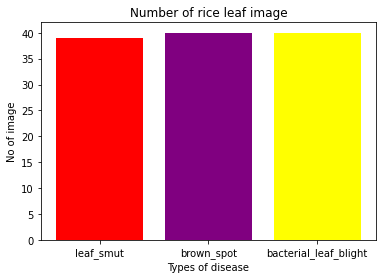

In [7]:
dataset_bar= {'leaf_smut':len(leaf_smut),'brown_spot':len(brown_spot),'bacterial_leaf_blight':len(bacterial_leaf_blight)}
color=['red','purple','yellow']
plt.bar(dataset_bar.keys(),dataset_bar.values(),width=0.8,color=color)
plt.title("Number of rice leaf image")
plt.ylabel("No of image")
plt.xlabel("Types of disease")
plt.show

* Why we needs to convert image into numpy array:- Because of image data in binary form so convert image data into numpy array so we do different operation on image data like manipulation, data transforming, filtering and mathematical operation and proper overall controlling of image data to visualize image with help of matplotlib framwork.

In [56]:
for image_batch,labels_batch in dataset.take(1):
    print("Image shape:-",image_batch.shape)
    print("Image covert into numpy label batch is:-",labels_batch.numpy())
print("Total batch of data set:-",len(dataset))

Image shape:- (12, 299, 299, 3)
Image covert into numpy label batch is:- [0 2 2 1 0 0 2 0 0 0 0 1]
Total batch of data set:- 10


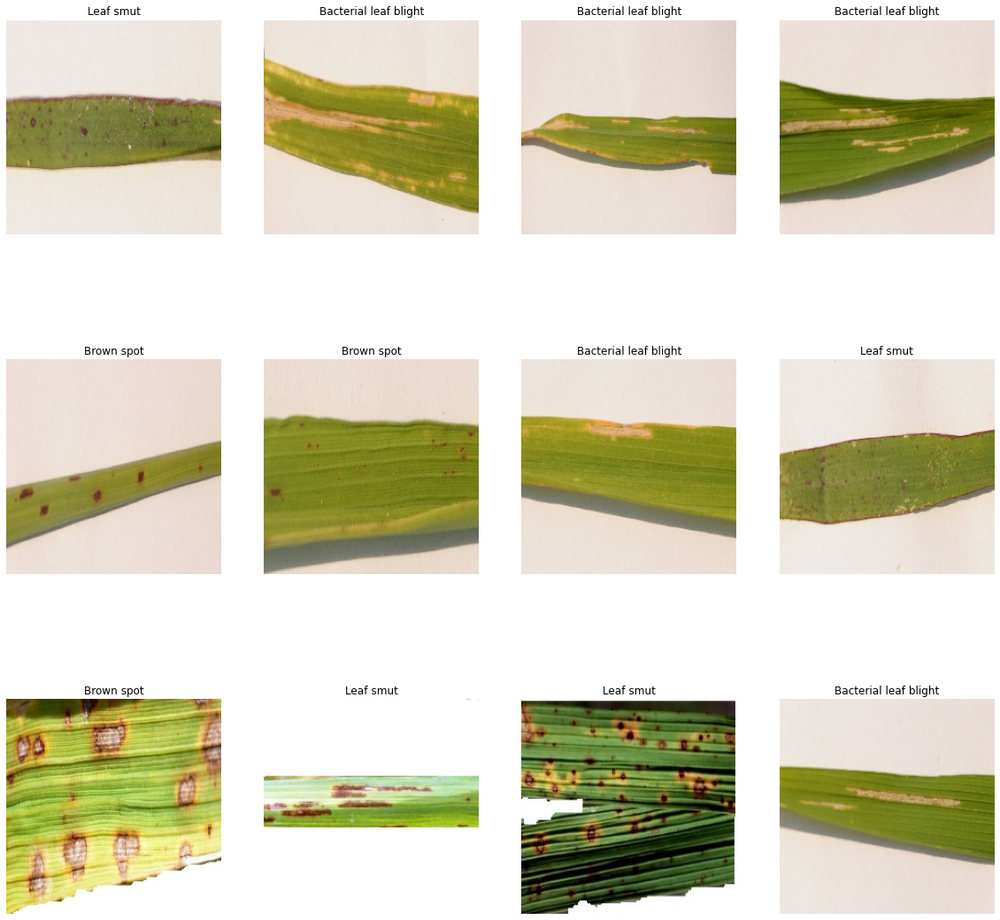

In [14]:
plt.figure(figsize=(20,20))
for images,labels in train_df.take(1):
    for i in range(12):
        axis=plt.subplot(3,4,i+1)
        plt.imshow(images[i].numpy().astype('uint8'))
        plt.title(class_dataset[labels[i]])
        plt.axis("off")

# Data splitting into traindata, validation data and test data

### Our dataset overview:- 
* Dataset batch is divide into 10 batch.
* Train data split into 80%.
* Test data split into 10%.
* Validation data split into 10%.

In [71]:
# Manual splitting datasets into train,test and validation function.
def get_dataset_partitions_tf(df,train_split=0.8,test_split=0.1,val_split=0.1,shuffle=True,shuffle_size=100):
    assert(train_split+test_split+val_split)==1
    
    df_size = len(df)
    
    if shuffle:
        df=df.shuffle(shuffle_size,seed=150)
        
        train_size=int(train_split*df_size)
        val_size=int(val_split*df_size)
        
        train_df= df.take(train_size)
        val_df=df.skip(train_size).take(val_size)
        test_df=df.skip(train_size).skip(val_size)
        
        return train_df, val_df, test_df

In [72]:
train_df, val_df, test_df = get_dataset_partitions_tf(dataset)

In [73]:
print("Train dataset batch:-",len(train_df))
print("Test dataset batch:-",len(test_df))
print("Validation dataset batch:-",len(val_df))

Train dataset batch:- 8
Test dataset batch:- 1
Validation dataset batch:- 1


In [74]:
# Train image data augmentation generator
train_datagen=ImageDataGenerator(
              rescale=1./255,               
              rotation_range=40,
              width_shift_range=0.2,
              height_shift_range=0.2,
              zoom_range=0.2,
              shear_range=0.2,              
              fill_mode='nearest',
              horizontal_flip=True,
              vertical_flip=True)               
              

# Testing image data augmentation generator
test_datagen=ImageDataGenerator(rescale=1./255)  


# Create generator for training image
train_datagenerator=train_datagen.flow_from_directory(
                  r"C:\Users\Admin\Downloads\Data\Train",
                  target_size=IMAGE_SIZE,     # Resize of all images, uniform of size.
                  batch_size=BATCH_SIZE,     # Each batch 25 images of datasets.
                  class_mode='categorical')  # Multi class clasification so use categorical.
                  
               
# Create generator for testing image
validation_datagenerator=test_datagen.flow_from_directory(
                   r"C:\Users\Admin\Downloads\Data\Test",
                   target_size=IMAGE_SIZE,     # Resize of all images, uniform of size.
                   batch_size=BATCH_SIZE,     # Each batch 23 images of datasets.
                   class_mode='categorical')  # Multi class clasification so use categorical.

Found 96 images belonging to 3 classes.
Found 23 images belonging to 3 classes.


In [75]:
resize_rescale= tf.keras.Sequential([
    layers.experimental.preprocessing.Resizing(IMAGE_SIZE,IMAGE_SIZE),
    layers.experimental.preprocessing.Rescaling(1.0/255)])

In [76]:
Data_Augmentation= tf.keras.Sequential([
    layers.experimental.preprocessing.RandomFlip(mode="horizontal_and_vertical",seed=10),
    layers.experimental.preprocessing.RandomRotation(0.2),
    layers.experimental.preprocessing.RandomZoom(height_factor=0.3,width_factor=0.3)
])

* Improve imagedatasets processing very fast without delay time of processing in CPU. Prefetch use for improve training performance.

In [77]:
train_df = train_df.cache().shuffle(100).prefetch(buffer_size=tf.data.AUTOTUNE) 
val_df = val_df.cache().shuffle(100).prefetch(buffer_size=tf.data.AUTOTUNE)
test_df = test_df.cache().shuffle(100).prefetch(buffer_size=tf.data.AUTOTUNE)

In [78]:
train_df = train_df.map(
    lambda x, y: (Data_Augmentation(x, training=True), y)
).prefetch(buffer_size=tf.data.AUTOTUNE)

# Generate convolution neural netwrok for multiclass classification.

### Use first manual Manual model but getting only 55% validation accuracy and 65% training acuuracy.

In [ ]:

model = Sequential() # Create sequential model 
    
# Apply convolution layers to capture local patterns #kernel_regularizer=keras.regularizers.L2(l2=0.01)
# layer1 = convolution and maxplooing 
model.add(Conv2D(filters=32,kernel_size=(3,3),input_shape=(224,224,3))) # cov2D is dot product b/t kernal size and input image, 32 bit size of data image filter is (3,3)
model.add(Activation('relu'))                                  # Hidden layer apply as ReLu activation
model.add(MaxPooling2D(pool_size=(2,2)))                          # Reduce feature size like (3,3) 

# Layer 2 = convolution and maxplooing
model.add(Conv2D(filters=64,kernel_size=(3,3)))           # filter 32 bit of neuron number used.               
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
batch1=BatchNormalization(momentum=0.99,epsilon=0.001)

# Layer 3 = convolution and maxplooing
model.add(Conv2D(filters=128,kernel_size=(3,3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
batch2=BatchNormalization(momentum=0.99,epsilon=0.001)

# Layer 4 = convolution and maxplooing 
model.add(Conv2D(filters=256,kernel_size=(3,3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
    
model.build(input_shape=(150,150,3))

# flatten,dense,dropout and output 
    
model.add(Flatten())                      # Flatten output of model.
model.add(Dense(64,activation='relu'))    # Fully connected CNN layer with 64 bit nurons activation function is relu.
model.add(Dropout(0.9))                   # dropout 90% of data
model.add(Dense(128,activation='relu'))   # Fully connected CNN layer with 128 bit nurons activation function is relu.
model.add(Dropout(0.5))                   # dropout 50% of data
model.add(Dense(3,activation='softmax')) # 3 class of layes of CNN used for model train, activation function is softmax use for Multiclass classification process.                                                               

# Implement Transfer learning

## Train InceptionV3 model

### Use InceptionV3 we getting 69.37% validation accuracy and 97% training accuracy.

In [89]:
base_model=InceptionV3(include_top=True,
                       weights='imagenet',
                       input_shape=(Image_width,Image_height,3),
                       classifier_activation='softmax')
    

96112376/96112376 [==============================] - 83s 1us/step


In [96]:
x=Flatten()(base_model.output)
#x = MaxPooling2D()(base_model.output)
x = Dense(64, activation='relu')(x)
x = tf.keras.layers.Dropout(0.9)(x)  
output = Dense(3, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=output)

# Train VGG16 Model

### Use VGG16 getting 65% validation accuracy and 98% training accuracy.

In [81]:
# During model training all layer freeze by this coding and not tobe trained again.
for layer in base_model.layers:
    layer.trainable=False

In [255]:

x=Flatten()(base_model.output)
#x=Flatten(input_shape=(224,224,3))(x)
#x=Dense(100,activation='relu')(x)
#x=Dropout(0.2)(x)
#x=Dense(50,activation='relu')(x)
##x=BatchNormalization()(x)
##x=Dropout(0.2)(x)
#x=regularizers.l2(0.01)(x)
x=Dense(3,activation="relu")(x)

output=Dense(3, activation='softmax')(x)


model = Model(inputs=base_model.input, outputs=output)

In [97]:
optm=optimizers.Adam(learning_rate=0.0002, beta_1=0.9, beta_2=0.999, amsgrad=False) 
model.compile(
    optimizer = optm,
    loss="categorical_crossentropy",
    metrics=['accuracy']
)

In [98]:
model_path="C:\\Users\\Admin\\Downloads\\Data\\Rice_leaf_disease"    # Give path of directory.
checkpoint=ModelCheckpoint(model_path,monitor='val_accuracy',save_best_only=True,mode='max',verbose=1)  
callbacks_list=[checkpoint]      # To return onlly maximum Val_accuracy recall and fix particular epochs for entire data.

In [99]:
model.summary()

Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_7 (InputLayer)        [(None, 299, 299, 3)]        0         []                            
                                                                                                  
 conv2d_478 (Conv2D)         (None, 149, 149, 32)         864       ['input_7[0][0]']             
                                                                                                  
 batch_normalization_474 (B  (None, 149, 149, 32)         96        ['conv2d_478[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 activation_478 (Activation  (None, 149, 149, 32)         0         ['batch_normalization_47

# Training the image multiclass classification model for Data generator

In [100]:
history=model.fit(
        train_datagenerator,
        steps_per_epoch=96//BATCH_SIZE ,
        epochs=Epoches,
        validation_data=validation_datagenerator,
        validation_steps= 23//BATCH_SIZE,
        callbacks=callbacks_list
)

Epoch 1/20
8/8 [==============================] - ETA: 0s - loss: 1.0968 - accuracy: 0.3958 
Epoch 1: val_accuracy improved from -inf to 0.41667, saving model to C:\Users\Admin\Downloads\Data\Rice_leaf_disease
INFO:tensorflow:Assets written to: C:\Users\Admin\Downloads\Data\Rice_leaf_disease\assets


INFO:tensorflow:Assets written to: C:\Users\Admin\Downloads\Data\Rice_leaf_disease\assets


8/8 [==============================] - 567s 63s/step - loss: 1.0968 - accuracy: 0.3958 - val_loss: 1.0977 - val_accuracy: 0.4167
Epoch 2/20
8/8 [==============================] - ETA: 0s - loss: 1.0987 - accuracy: 0.3542 
Epoch 2: val_accuracy did not improve from 0.41667
8/8 [==============================] - 379s 47s/step - loss: 1.0987 - accuracy: 0.3542 - val_loss: 1.1008 - val_accuracy: 0.3333
Epoch 3/20
8/8 [==============================] - ETA: 0s - loss: 1.0989 - accuracy: 0.2917 
Epoch 3: val_accuracy did not improve from 0.41667
8/8 [==============================] - 424s 53s/step - loss: 1.0989 - accuracy: 0.2917 - val_loss: 1.1000 - val_accuracy: 0.2500
Epoch 4/20
8/8 [==============================] - ETA: 0s - loss: 1.0868 - accuracy: 0.4271 
Epoch 4: val_accuracy did not improve from 0.41667
8/8 [==============================] - 442s 55s/step - loss: 1.0868 - accuracy: 0.4271 - val_loss: 1.0897 - val_accuracy: 0.4167
Epoch 5/20
8/8 [==============================] - ET

INFO:tensorflow:Assets written to: C:\Users\Admin\Downloads\Data\Rice_leaf_disease\assets


8/8 [==============================] - 780s 103s/step - loss: 1.0732 - accuracy: 0.4375 - val_loss: 1.0907 - val_accuracy: 0.5833
Epoch 6/20
8/8 [==============================] - ETA: 0s - loss: 1.0799 - accuracy: 0.4896  
Epoch 6: val_accuracy improved from 0.58333 to 0.75000, saving model to C:\Users\Admin\Downloads\Data\Rice_leaf_disease
INFO:tensorflow:Assets written to: C:\Users\Admin\Downloads\Data\Rice_leaf_disease\assets


INFO:tensorflow:Assets written to: C:\Users\Admin\Downloads\Data\Rice_leaf_disease\assets


8/8 [==============================] - 697s 90s/step - loss: 1.0799 - accuracy: 0.4896 - val_loss: 1.0820 - val_accuracy: 0.7500
Epoch 7/20
8/8 [==============================] - ETA: 0s - loss: 1.0664 - accuracy: 0.4792 
Epoch 7: val_accuracy did not improve from 0.75000
8/8 [==============================] - 513s 60s/step - loss: 1.0664 - accuracy: 0.4792 - val_loss: 1.0748 - val_accuracy: 0.5833
Epoch 8/20
8/8 [==============================] - ETA: 0s - loss: 1.0616 - accuracy: 0.4896  
Epoch 8: val_accuracy did not improve from 0.75000
8/8 [==============================] - 487s 62s/step - loss: 1.0616 - accuracy: 0.4896 - val_loss: 1.0902 - val_accuracy: 0.4167
Epoch 9/20
8/8 [==============================] - ETA: 0s - loss: 1.0830 - accuracy: 0.4271 
Epoch 9: val_accuracy did not improve from 0.75000
8/8 [==============================] - 452s 56s/step - loss: 1.0830 - accuracy: 0.4271 - val_loss: 1.0728 - val_accuracy: 0.6667
Epoch 10/20
8/8 [==============================] - 

INFO:tensorflow:Assets written to: C:\Users\Admin\Downloads\Data\Rice_leaf_disease\assets


8/8 [==============================] - 446s 58s/step - loss: 1.0607 - accuracy: 0.4167 - val_loss: 1.0414 - val_accuracy: 0.8333
Epoch 15/20
8/8 [==============================] - ETA: 0s - loss: 1.0525 - accuracy: 0.4688 
Epoch 15: val_accuracy did not improve from 0.83333
8/8 [==============================] - 340s 42s/step - loss: 1.0525 - accuracy: 0.4688 - val_loss: 1.0474 - val_accuracy: 0.6667
Epoch 16/20
8/8 [==============================] - ETA: 0s - loss: 1.0525 - accuracy: 0.5729 
Epoch 16: val_accuracy did not improve from 0.83333
8/8 [==============================] - 338s 42s/step - loss: 1.0525 - accuracy: 0.5729 - val_loss: 1.0604 - val_accuracy: 0.5833
Epoch 17/20
8/8 [==============================] - ETA: 0s - loss: 1.0399 - accuracy: 0.5208 
Epoch 17: val_accuracy did not improve from 0.83333
8/8 [==============================] - 329s 42s/step - loss: 1.0399 - accuracy: 0.5208 - val_loss: 1.0755 - val_accuracy: 0.5000
Epoch 18/20
8/8 [=============================

* Validation accuracy save on particular epoch number is 14 and accuracy is 83.33%. 
* 8/8 [==============================] - ETA: 0s - loss: 1.0607 - accuracy: 0.4167 Epoch 14: val_accuracy improved from 0.75000 to 0.83333.


# Evalution process of Model

In [101]:
loss,accuracy=model.evaluate(validation_datagenerator,steps=len(validation_datagenerator))
print(f"Test accuracy: {accuracy*100:.2f}%")
print("Score of test model loss and accuracy",loss,accuracy)

2/2 [==============================] - 20s 9s/step - loss: 1.0256 - accuracy: 0.6957
Test accuracy: 69.57%
Score of test model loss and accuracy 1.0256223678588867 0.695652186870575


In [102]:
loss,accuracy=model.evaluate(train_datagenerator,steps=len(train_datagenerator))
print(f"Training accuracy: {accuracy*100:.2f}%")
print("Score of Training model loss and accuracy:",loss,accuracy)

8/8 [==============================] - 106s 12s/step - loss: 1.0184 - accuracy: 0.7604
Training accuracy: 76.04%
Score of Training model loss and accuracy: 1.0184358358383179 0.7604166865348816


In [103]:
history.params

{'verbose': 1, 'epochs': 20, 'steps': 8}

In [104]:
history.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

In [105]:
acc=history.history['accuracy']
val_acc=history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']


In [106]:
epoches_range=range(Epoches)

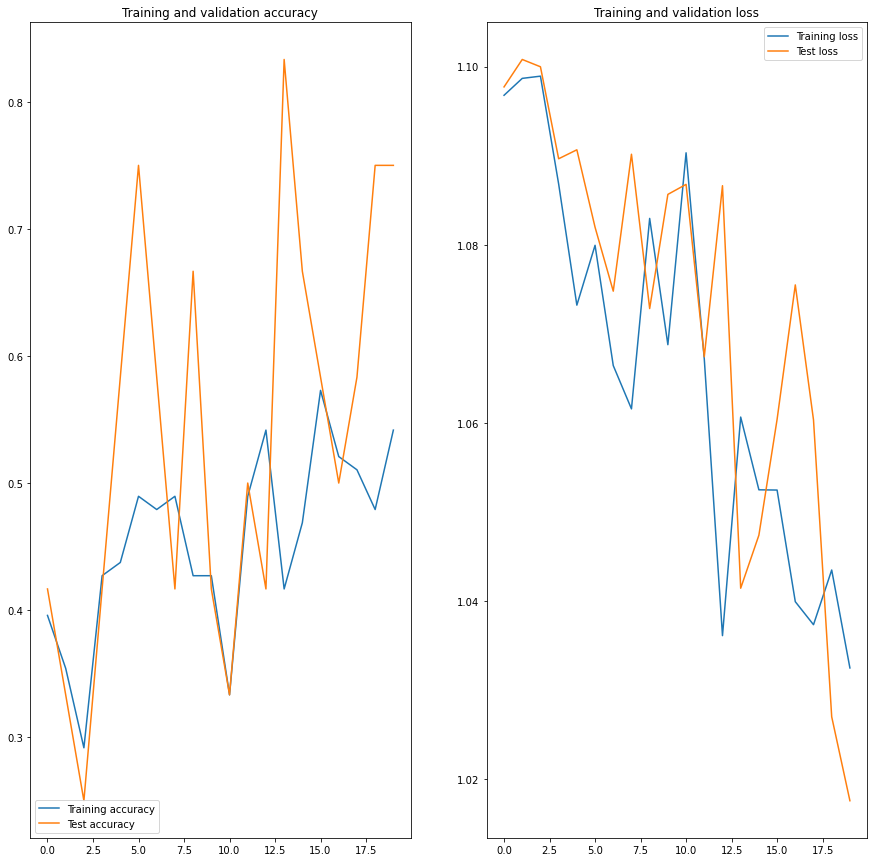

In [107]:
plt.figure(figsize=(15,15))

plt.subplot(1,2,1)
plt.plot(epoches_range,acc,label='Training accuracy')
plt.plot(epoches_range,val_acc,label='Test accuracy')
plt.title("Training and validation accuracy")
plt.legend(loc=3)

plt.subplot(1,2,2)
plt.plot(epoches_range,loss,label='Training loss')
plt.plot(epoches_range,val_loss,label='Test loss')
plt.title("Training and validation loss")
plt.legend(loc=1)
plt.show()

# Trained Model use for Predict Disease on a Test Sample

In [116]:
# Load image for specific path.
img= load_img(r"C:\Users\Admin\Downloads\Data\Test\Bacterial leaf blight\DSC_0701.jpg")
            
# image resiging and reshaping of input image shape (1,224,224,3)
x=img_to_array(img.resize([Image_width,Image_height]))
x=x.reshape((1,) + x.shape)   
              
# Make prediction of training model
y_predict= model.predict(x)
              
# Find prediction of highest prediction probability
Pre_class=np.argmax(y_predict,axis=1)

# Interpret pridcted class and predict corresponding disease.
if Pre_class == 0:
              print("Disease of rice leaf is: Leaf Smut")
elif Pre_class == 1:
              print("Disease of rice leaf is: bacterial leaf blight")
else:
              print("Disease of rice leaf is: Brown spot")

1/1 [==============================] - 1s 690ms/step
Disease of rice leaf is: bacterial leaf blight


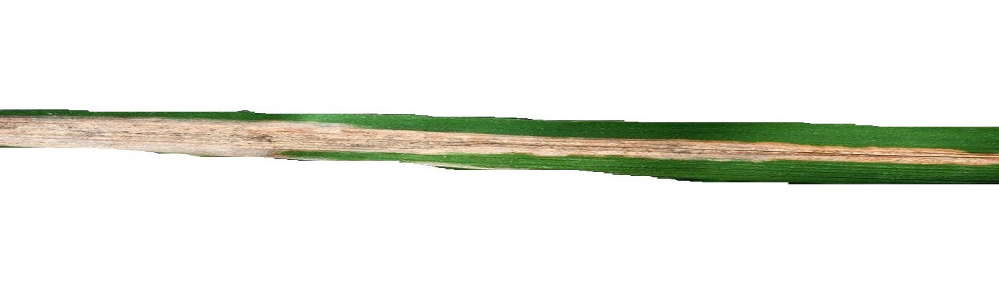

In [117]:
img

In [110]:
# Load image for specific path.
img1= load_img(r"C:\Users\Admin\Downloads\Data\Test\Bacterial leaf blight\DSC_0404.jpg")
            
# image resiging and reshaping of input image shape (1,224,224,3)
x=img_to_array(img.resize([Image_width,Image_height]))
x=x.reshape((1,) + x.shape)   
              
# Make prediction of training model
y_predict= model.predict(x)
              
# Find prediction of highest prediction probability
Pre_class=np.argmax(y_predict,axis=1)

# Interpret pridcted class and predict corresponding disease.
if Pre_class == 0:
              print("Disease of rice leaf is: Leaf Smut")
elif Pre_class == 1:
              print("Disease of rice leaf is: bacterial leaf blight")
else:
              print("Disease of rice leaf is: Brown spot")

1/1 [==============================] - 1s 1s/step
Disease of rice leaf is: bacterial leaf blight


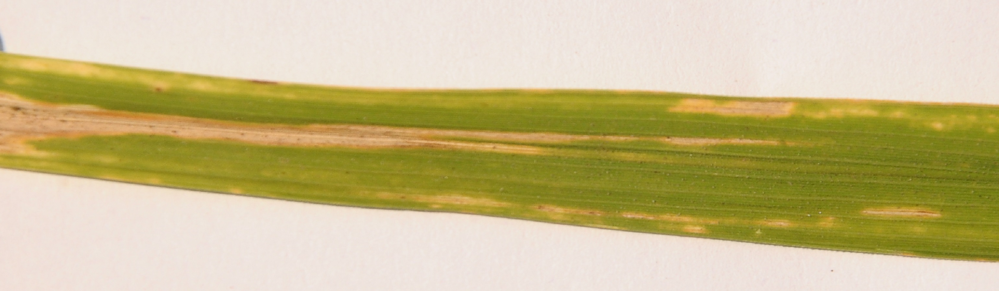

In [111]:
img1

In [125]:
# Load image for specific path.
img2= load_img(r"C:\Users\Admin\Downloads\Data\Test\Brown spot\DSC_0324.jpg")
            
# image resiging and reshaping of input image shape (1,224,224,3)
x=img_to_array(img.resize([Image_width,Image_height]))
x=x.reshape((1,) + x.shape)   
              
# Make prediction of training model
y_predict= model.predict(x)
              
# Find prediction of highest prediction probability
Pre_class=np.argmax(y_predict,axis=1)

# Interpret pridcted class and predict corresponding disease.
if Pre_class == 0:
              print("Disease of rice leaf is: Leaf Smut")
elif Pre_class == 1:
              print("Disease of rice leaf is: bacterial leaf blight")
else:
              print("Disease of rice leaf is: Brown spot")

1/1 [==============================] - 1s 1s/step
Disease of rice leaf is: bacterial leaf blight


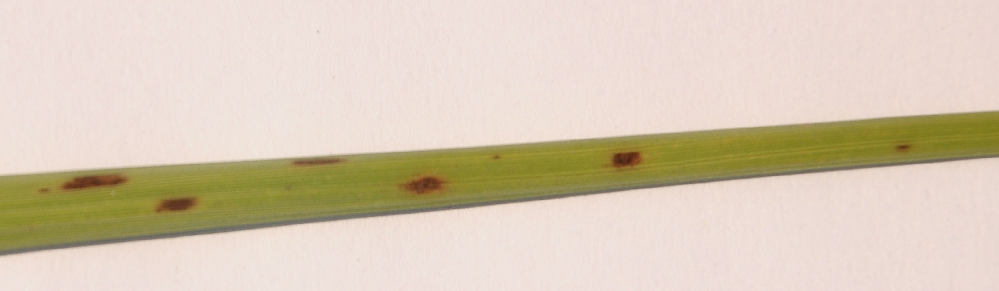

In [126]:
img2

# Result

* The result of our expriment that CNN model and other learning model like VGG16 and InceptionV3 works accuretly but our trained model works on marginal accuracy so getting moderate result but not give extremely good result. 
* Defenatly all models have potential to find out disease of rice leaf.

# Challenges and Opportunities

* Here in Rice leaf disease project needs to address many challanges but we were share some point here. like we use many techniques and pre trained model like VGG16 and IncerptionV3 as well as CNN model also we were getting best accuracy in VGG16 is maximum 65% validation accuracy . InceptionV3 model we were getting validation accuracy is near to 69% and CNN model we were getting first time 55% validation accuracy in all case training accuracy above 85%.
* After we were frequently change hyperparameter tuning of data so CNN model accuracy almost decrease 33.33% and does not increase training and validation accuracy still frequently change data aumentation process, layers,learning rate, Batchnormalization, Regularization, dropout ratio all related factor of improve accuracy which all change freqently.
* INceptionV3 and VGG16 getting marginal increase validation accuracy but still not touch above 80% accuracy which we were aspected.  

# Conclusion

In this report, we presented a data analysis of rice leaf disease detection using CNNs,VGG16 and InceptionV3. We showed that all models can be used to accurately detect rice leaf diseases. All models is due to its ability to learn the features of healthy and diseased rice leaves. We believe that all models have the potential to revolutionize the way that rice leaf diseases are detected.